In [1]:
import json
from pathlib import Path

import bezier
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [2]:
bdd100k_path = Path('/home/sergei/Downloads/bdd100k')

bdd100k_images_path = bdd100k_path / 'images/100k'
bdd100k_train_images_path = bdd100k_images_path / 'train'
bdd100k_val_images_path = bdd100k_images_path / 'val'

bdd100k_labels_path = bdd100k_path / 'labels'
bdd100k_lane_labels_path = bdd100k_labels_path / 'lane/polygons'
bdd100k_train_lane_labels_path = bdd100k_lane_labels_path / 'lane_train.json'
bdd100k_val_lane_labels_path = bdd100k_lane_labels_path / 'lane_val.json'

frames_info = dict()

with open(bdd100k_train_lane_labels_path) as f:
    frames_info = json.load(f)
    
frames_info[1]['labels'][0]

{'id': '0',
 'attributes': {'laneDirection': 'parallel',
  'laneStyle': 'solid',
  'laneTypes': 'road curb'},
 'category': 'road curb',
 'poly2d': [{'vertices': [[1230.99113, 620.749416],
    [1097.642939, 531.482176],
    [826.538354, 414.663319],
    [829.844506, 367.274536]],
   'types': 'LCCC',
   'closed': False}]}

In [82]:
class Lane:
    def __init__(
        self,
        index,
        curve,
        horizontal_curves,
        point_radius: int = 1,
    ):
        self.index = index
        self.curve = curve
        self.n_points = 0
        self.point_indices = set()
        self.x_coords = dict()
        self.y_coords = dict()

        self.get_points_from_horizontal_curves_(horizontal_curves)

        self.color = (255 - index * 50, 0, index * 10)
        self.point_radius = point_radius

    def get_points_from_horizontal_curves_(self, horizontal_curves) -> None:
        for i, horizontal_curve in enumerate(horizontal_curves):
            intersection_point = self.curve.intersect(horizontal_curve)
            intersection_point = self.curve.evaluate_multi(intersection_point[0, :])

            if intersection_point.shape[1] != 0:
                self.n_points += 1
                self.point_indices.add(i)
                x = int(intersection_point[0][0])
                y = int(intersection_point[1][0])
                self.x_coords[i] = x
                self.y_coords[i] = y
            
    def draw(self, image, color=None, radius=None):
        if color is None:
            color = self.color
            
        if radius is None:
            radius = self.point_radius
            
        prev_center = None

        for index in self.point_indices:
            center = (
                int(self.x_coords[index]),
                int(self.y_coords[index]),
            )

            image = cv2.circle(
                image,
                center,
                radius=radius,
                color=color,
                thickness=-1,
            )

            if prev_center is not None:
                if abs(prev_center[1] - center[1]) < 5:
                    image = cv2.line(
                        image,
                        prev_center,
                        center,
                        color=(255, 0, 255),
                        thickness=1,
                    )
            
            prev_center = center
            
        return image


def calc_max_distance_between_lanes(
    lane_1: Lane,
    lane_2: Lane,
) -> float:
    max_distance = 0
    diff_counter = 0

    for index in lane_1.point_indices:
        if index in lane_2.point_indices:
            x_1 = lane_1.x_coords[index]
            x_2 = lane_2.x_coords[index]
            cur_distance = abs(x_1 - x_2)
            max_distance = max(cur_distance, max_distance)

    if diff_counter > 20:
        return 1000
    else:
        return max_distance


def fill_spaces_between_lanes(
    image,
    lane_1: Lane,
    lane_2: Lane,
):
    for index in lane_1.point_indices:
        if index in lane_2.point_indices:
            x_1 = lane_1.x_coords[index]
            x_2 = lane_2.x_coords[index]
            y_1 = lane_1.y_coords[index]
            y_2 = lane_2.y_coords[index]

            for bias_y in range(-1, 2):
                image = cv2.line(
                    image,
                    (x_1, y_1+bias_y),
                    (x_2, y_2),
                    color=(0, 255, 0),
                    thickness=1,
                )
                image = cv2.line(
                    image,
                    (x_1, y_1),
                    (x_2, y_2+bias_y),
                    color=(0, 255, 0),
                    thickness=1,
                )
                
    for index in lane_1.point_indices:
        if index in lane_2.point_indices:
            x_1 = lane_1.x_coords[index]
            x_2 = lane_2.x_coords[index]
            y_1 = lane_1.y_coords[index]
            y_2 = lane_2.y_coords[index]
            center = (int((x_1+x_2)/2), int((y_1+y_2)/2))

            image = cv2.circle(
                image,
                center=center,
                color=(255, 0, 0),
                radius=1,
                thickness=-1,
            )

    return image


def get_horizontal_curves():
    horizontal_curves = list()

    for i in range(0, 800, 1):
        nodes = np.asarray([[0, 1280], [i, i]])

        horizontal_curve = bezier.Curve(
            nodes,
            degree=1,
        )
        horizontal_curves.append(horizontal_curve)
        
    return horizontal_curves

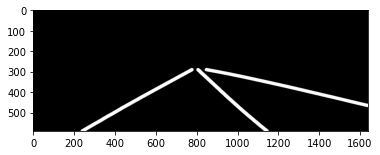

In [83]:
a = '/home/sergei/git/lanes/ultrafastlane/culane/laneseg_label_w16/driver_23_30frame/05151640_0419.MP4/00000.png'
im =cv2.imread(a)
plt.imshow(im * 255)

! [233.127, 590.0, 251.401, 580.0, 268.894, 570.0, 287.261, 560.0, 305.629, 550.0, 323.121, 540.0, 341.489, 530.0, 359.856, 520.0, 377.349, 510.0, 395.716, 500.0, 413.209, 490.0, 431.576, 480.0, 449.943, 470.0, 467.436, 460.0, 485.803, 450.0, 504.171, 440.0, 521.8, 430.0, 540.167, 420.0, 557.66, 410.0, 576.027, 400.0, 594.394, 390.0, 611.887, 380.0, 630.254, 370.0, 647.747, 360.0, 666.114, 350.0, 684.481, 340.0, 701.974, 330.0, 720.341, 320.0, 738.709, 310.0, 756.201, 300.0, 774.569, 290.0, 1128.54, 590.0, 1118.15, 580.0, 1107.16, 570.0, 1096.17, 560.0, 1085.19, 550.0, 1074.93, 540.0, 1063.95, 530.0, 1052.96, 520.0, 1042.71, 510.0, 1031.72, 500.0, 1020.73, 490.0, 1010.48, 480.0, 999.493, 470.0, 988.506, 460.0, 978.252, 450.0, 967.266, 440.0, 956.718, 430.0, 945.732, 420.0, 934.745, 410.0, 924.491, 400.0, 913.505, 390.0, 902.518, 380.0, 891.532, 370.0, 881.278, 360.0, 870.292, 350.0, 859.305, 340.0, 849.051, 330.0, 838.065, 320.0, 827.078, 310.0, 816.825, 300.0, 805.838, 290.0, 1665.75,

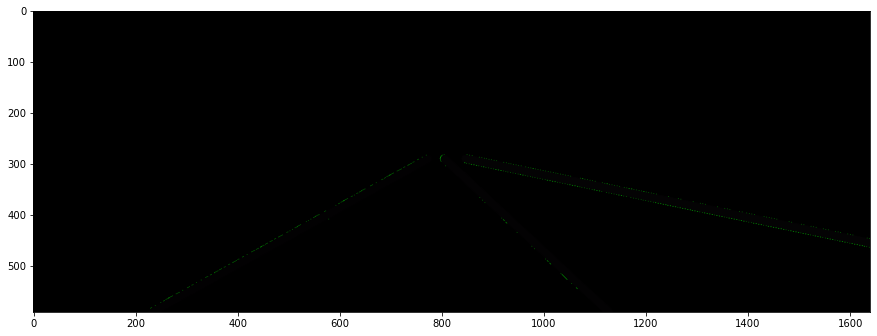

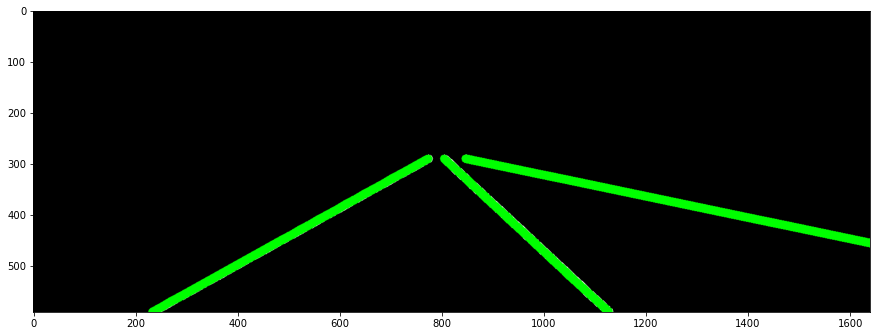

In [84]:
a = '/home/sergei/git/lanes/ultrafastlane/culane/laneseg_label_w16/driver_23_30frame/05151640_0419.MP4/00030.png'
im =cv2.imread(a)

b = '/home/sergei/git/lanes/ultrafastlane/culane/driver_23_30frame/05151640_0419.MP4/00030.lines.txt'
with open(b) as f:
    line = list(map(float, f.read().split()))
    print('!', line)

prev = None
for i in range(len(line) // 2):
    x = int(line[2 * i])
    y = int(line[2 * i + 1])
    #im = cv2.circle(im, (x, y), color=(1, 0, 0), radius=9, thickness=-1)
    if prev is not None:
        if y < prev[-1]:
            im = cv2.line(im, prev, (x, y), color=(0, 1, 0), thickness=15)
    prev = (x, y)



plt.figure(figsize=(15, 12))
im_orig = cv2.imread(a)
plt.imshow(im * 255 + im_orig)
plt.show()
plt.figure(figsize=(15, 12))
plt.imshow(im*255)
plt.show()

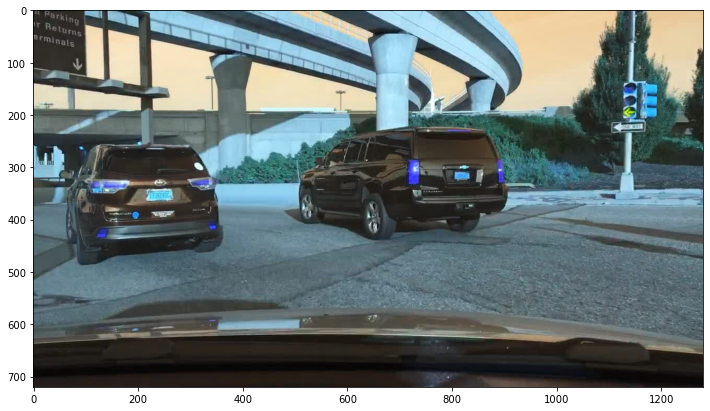

single white
single white
single white
single white
single white
single white


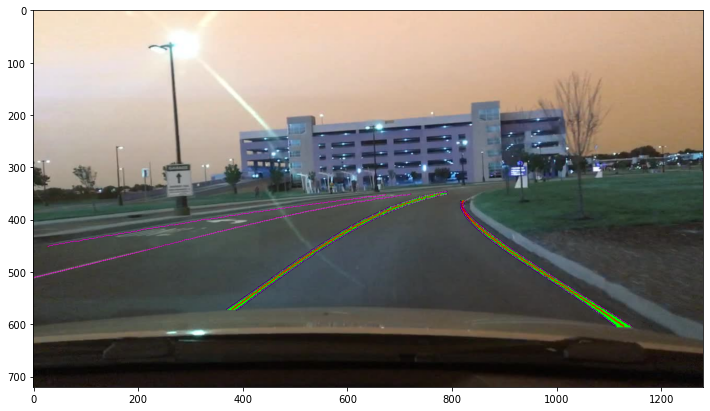

double yellow
double yellow


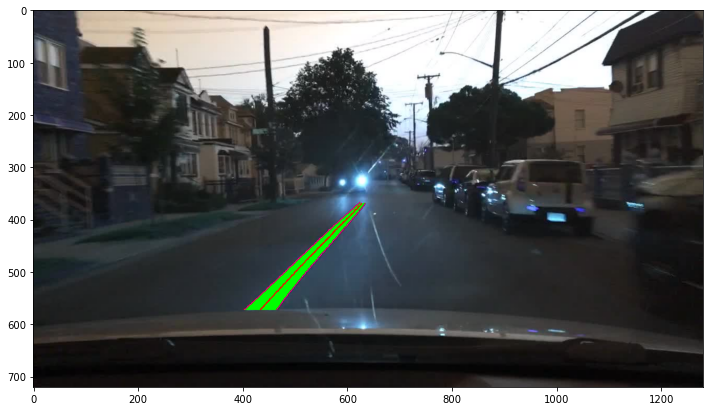

single white
single white


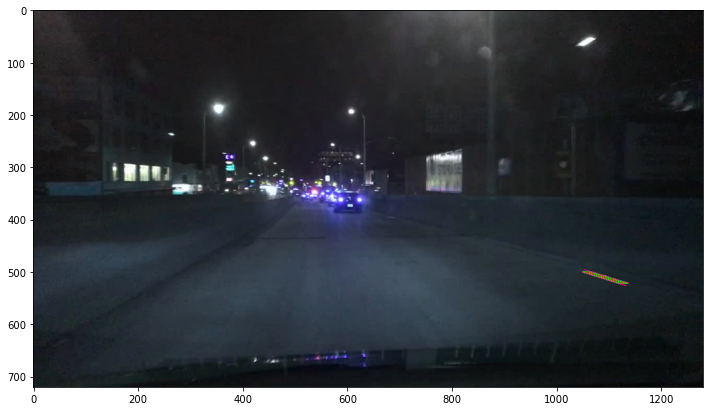

double yellow
double yellow


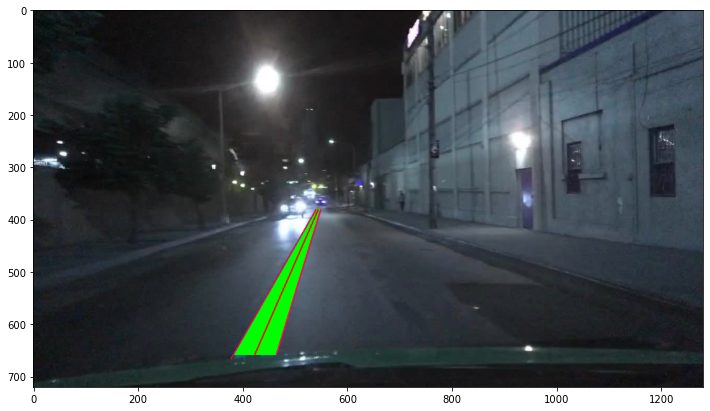

single white
single white


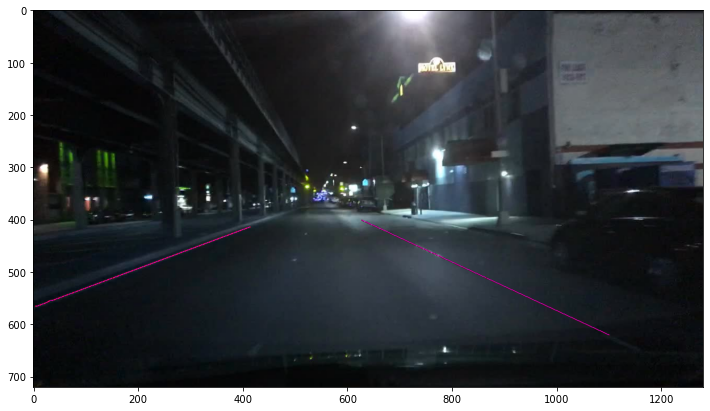

single white
single white
single white
single white
single white
single white


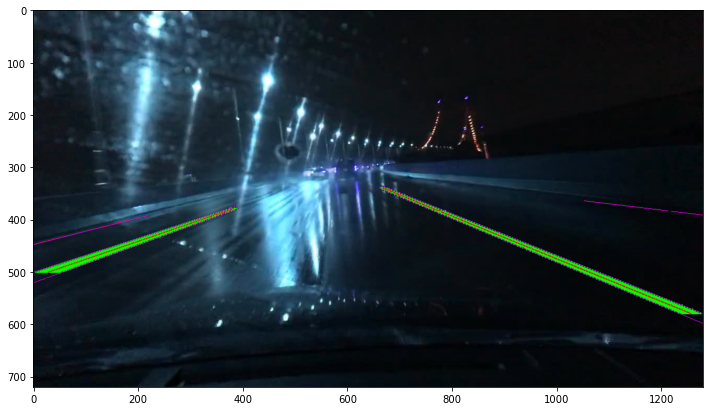

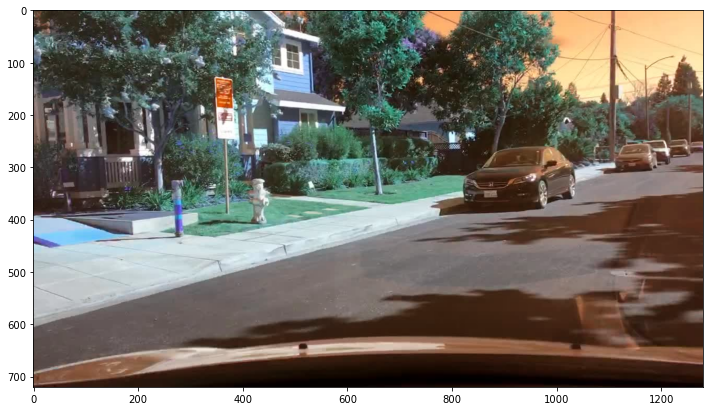

double yellow
double yellow
single white
single white
single white
single white
single white
single white


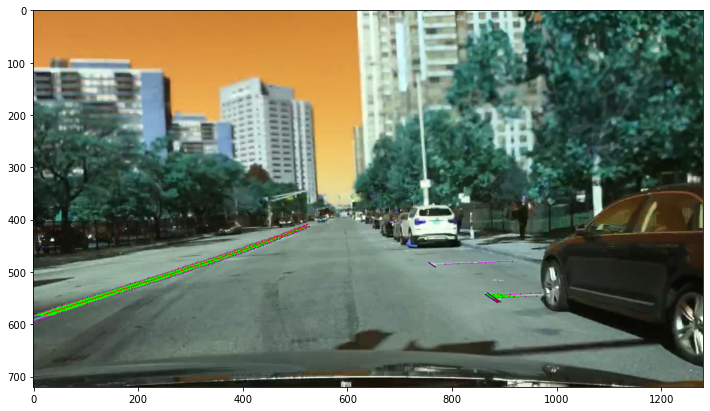

single white
single white
single yellow
single yellow


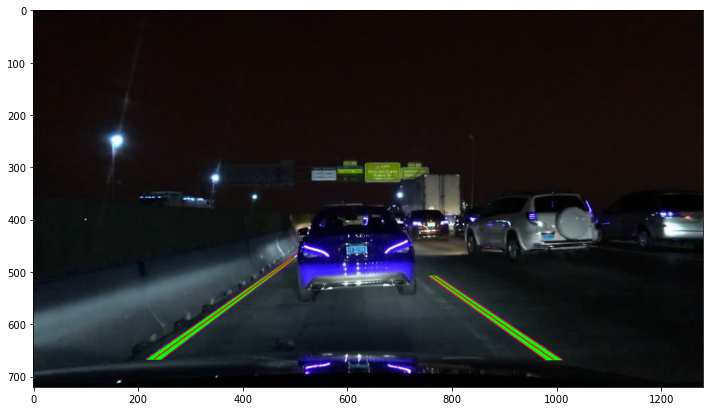

single white
single white
single white
single white
single white
single white


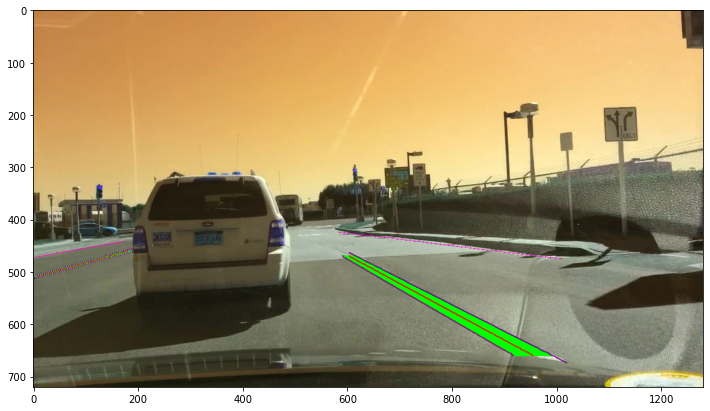

single white
single white
single white
single white
single white


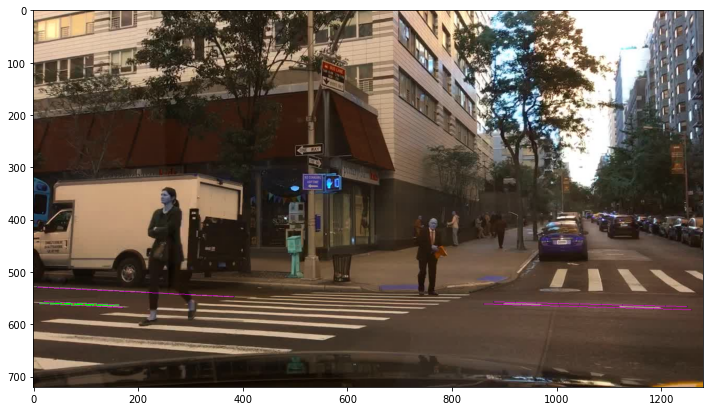

single white
single white
single white
single white
single white


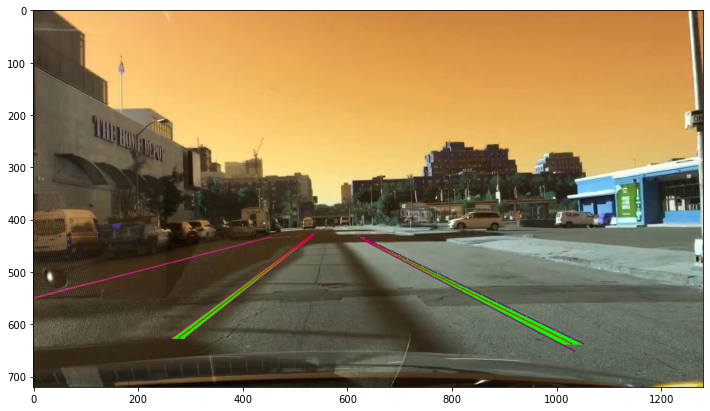

double yellow
double yellow
single white
single white
single white


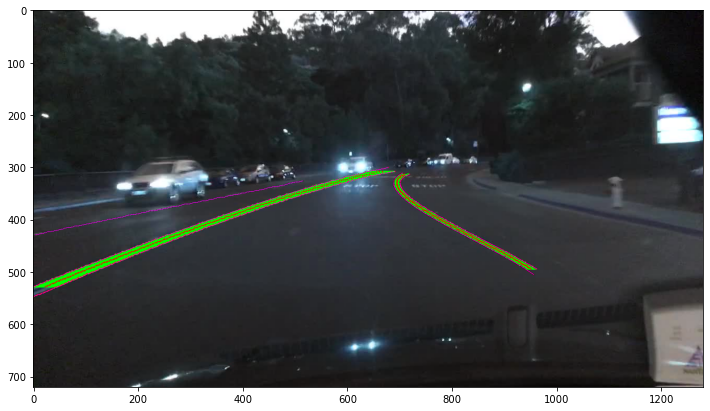

single white
double yellow
double yellow
single white
single white


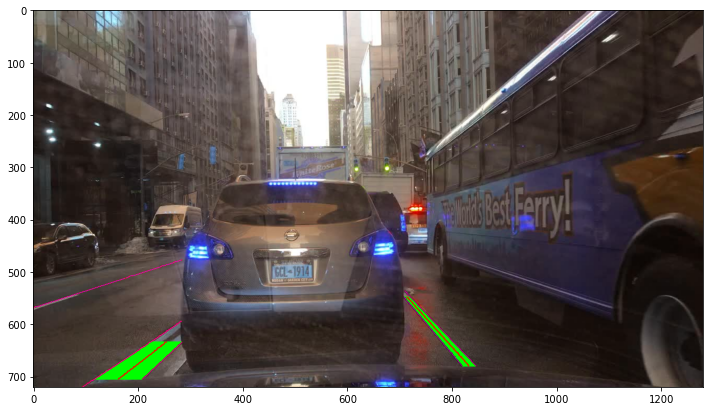

single white
single white
single white
single white


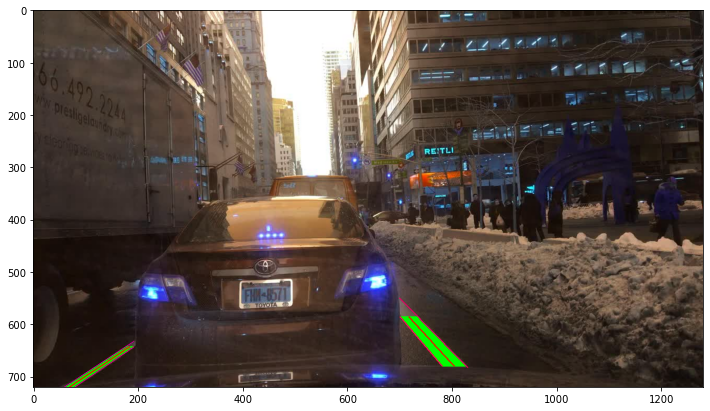

double yellow
single white


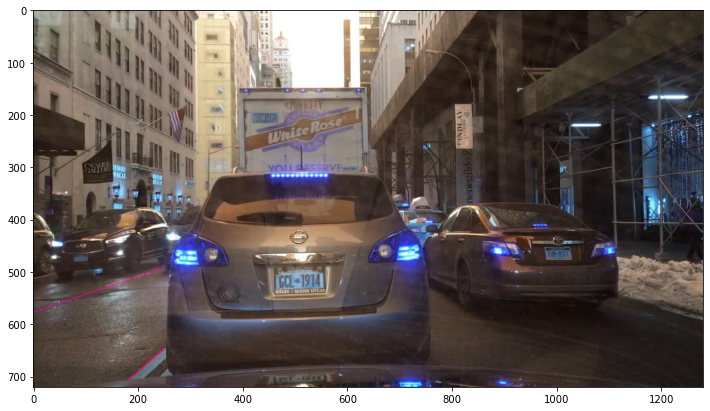

double yellow
double yellow
single white
single white
single white
single white


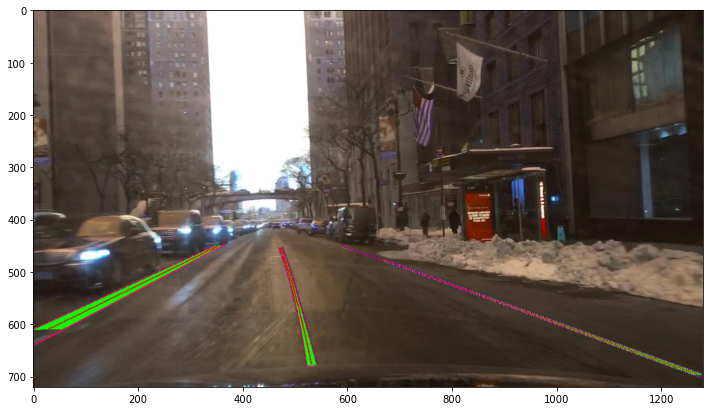

single white
single white


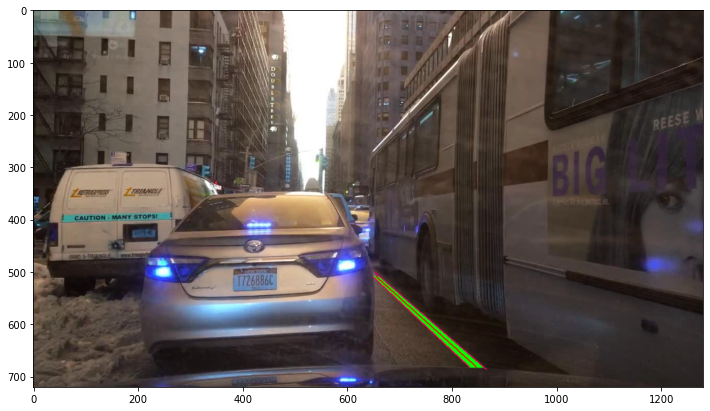

In [85]:
horizontal_curves = get_horizontal_curves()

for frame_index in range(20):
    frame_info = frames_info[frame_index]
    if 'labels' not in frame_info.keys():
        continue

    img = cv2.imread(str(bdd100k_train_images_path / frame_info['name']))
    lanes = list()

    for i, lane in enumerate(frame_info['labels']):
        if lane['category'] in ['crosswalk', 'road curb']:
            continue
        else:
            print(lane['category'])

        lane_nodes = np.array(lane['poly2d'][0]['vertices'])
        lane_curve = bezier.Curve(
            lane_nodes.T,
            degree=lane_nodes.shape[0] - 1,
        )
        lane = Lane(index=i, curve=lane_curve, horizontal_curves=horizontal_curves)
        lanes.append(lane)
        
    for i, lane_1 in enumerate(lanes):
        for j in range(i, len(lanes)):
            lane_2 = lanes[j]
            dist = calc_max_distance_between_lanes(lane_1, lane_2)
            if dist < 100:
                img = fill_spaces_between_lanes(img, lane_1, lane_2)
                
    for lane in lanes:
        img = lane.draw(img)#, color=(200, 15, 255))

    plt.figure(figsize=(12, 12))
    plt.imshow(img)
    plt.show()

In [14]:
def draw_curve(img, curve, color_flag=None):
    n_points = 750
    for j in range(n_points):
        if color_flag is None:
            color = (255 - i * 50, 0, i * 10)
        else:
            color = color_flag
        a0, b0 = curve.evaluate(j * 1/n_points)
        radius=1
        img = cv2.circle(img, (int(a0[0]), int(b0[0])), radius, color, thickness=-1)

In [5]:
np.array([]).shape

(0,)

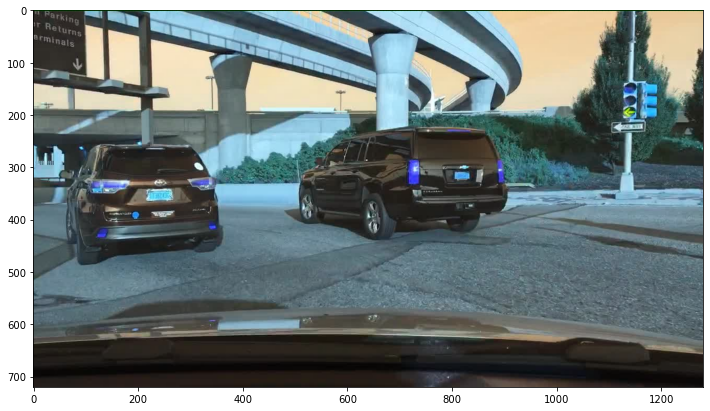

single white
single white
single white
single white
single white
single white


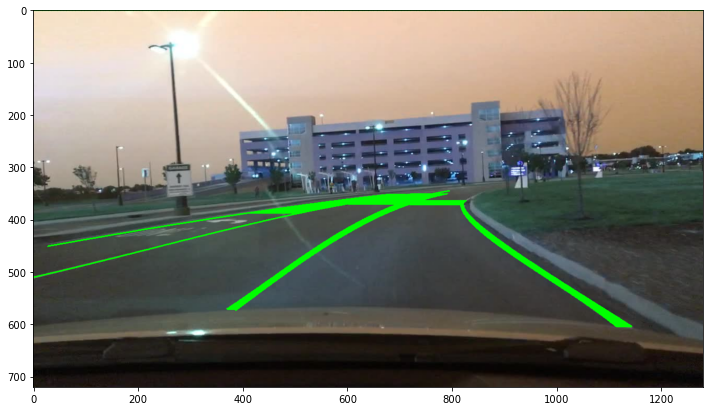

double yellow
double yellow


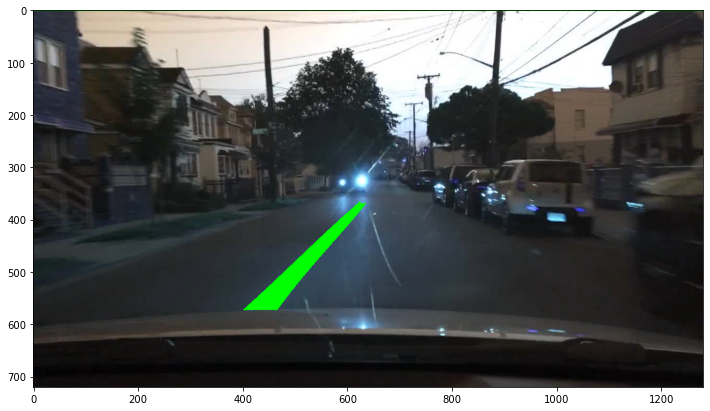

single white
single white


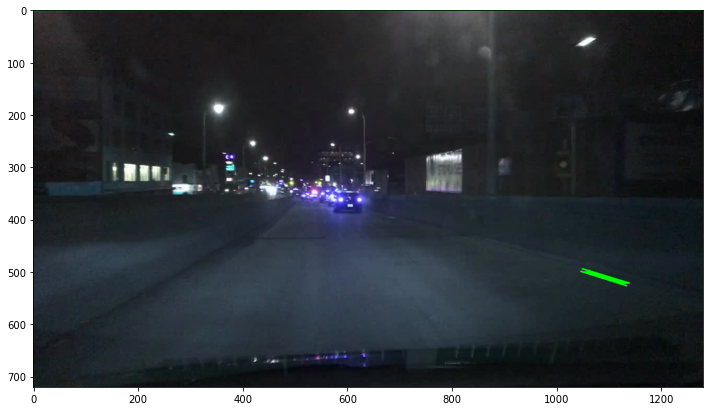

double yellow
double yellow


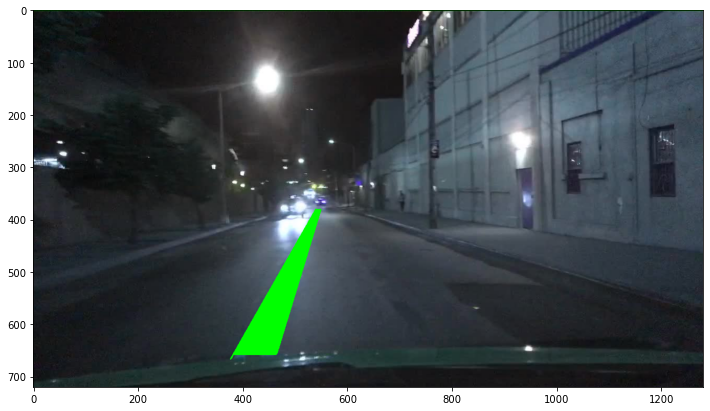

single white
single white


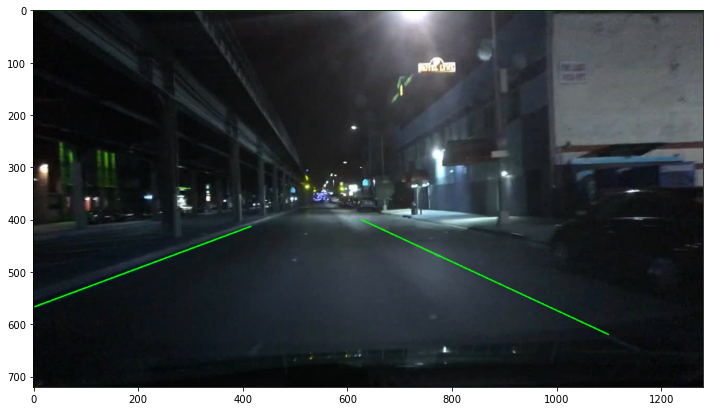

single white
single white
single white
single white
single white
single white


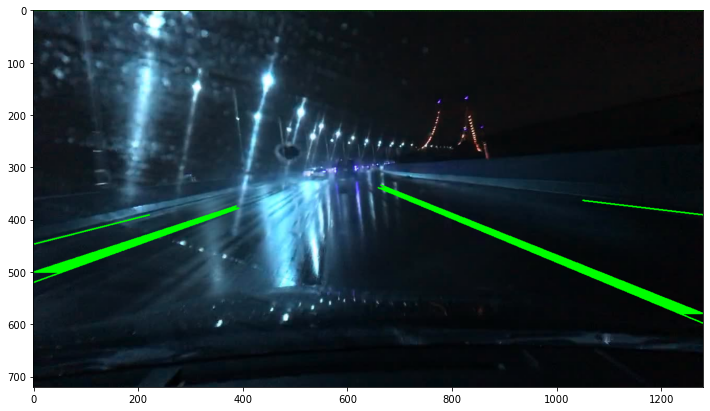

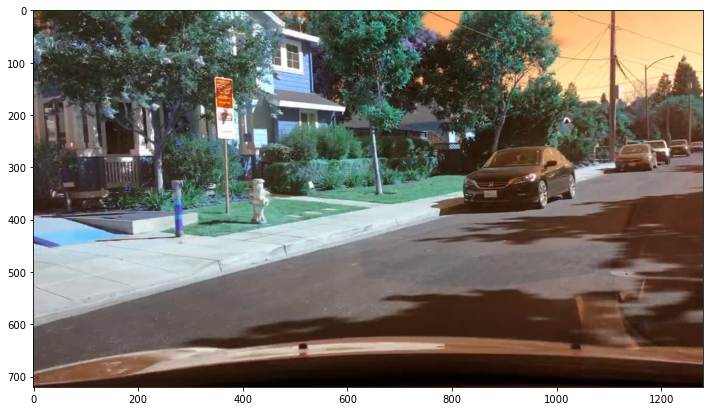

double yellow
double yellow
single white
single white
single white
single white
single white
single white


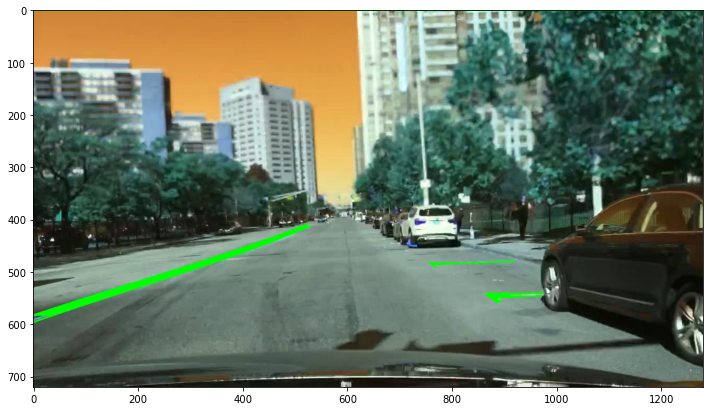

single white
single white
single yellow
single yellow


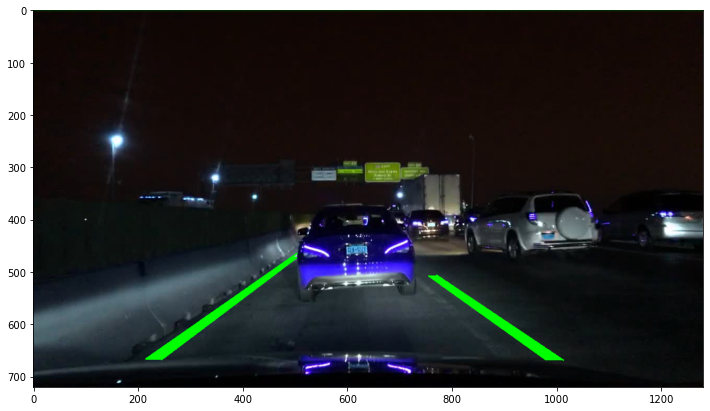

single white
single white
single white
single white
single white
single white


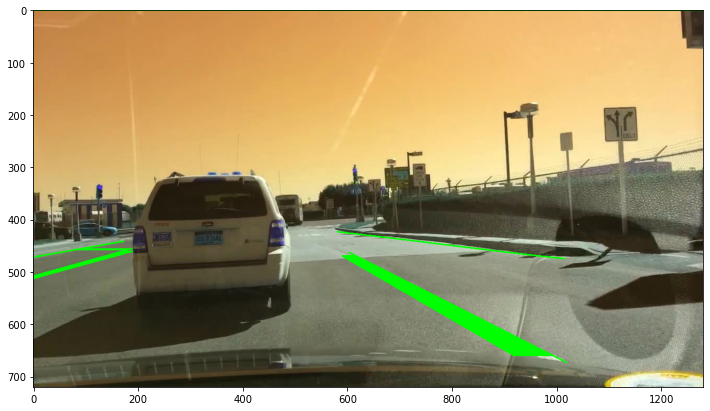

single white
single white
single white
single white
single white


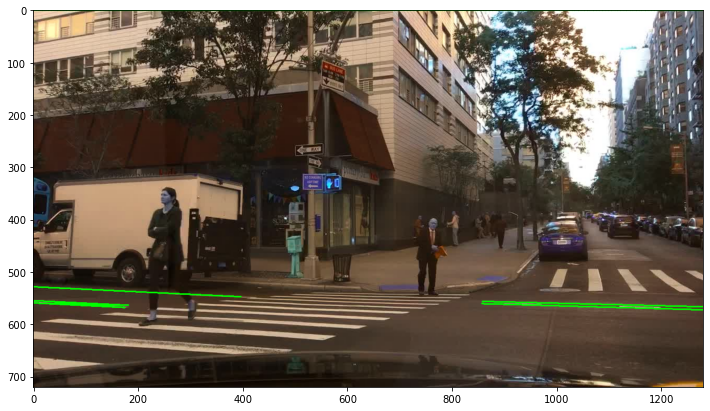

single white
single white
single white
single white
single white


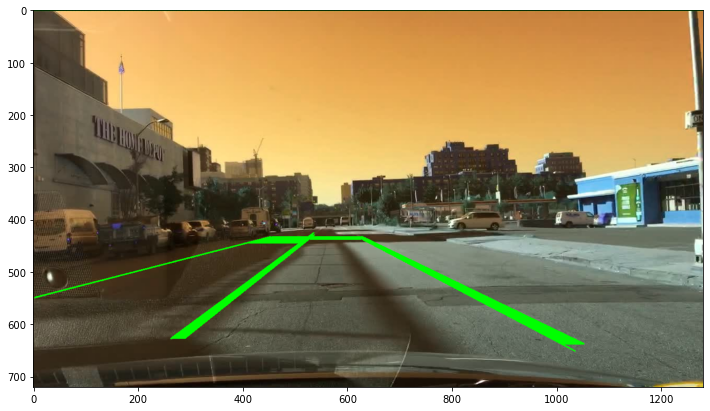

double yellow
double yellow
single white
single white
single white


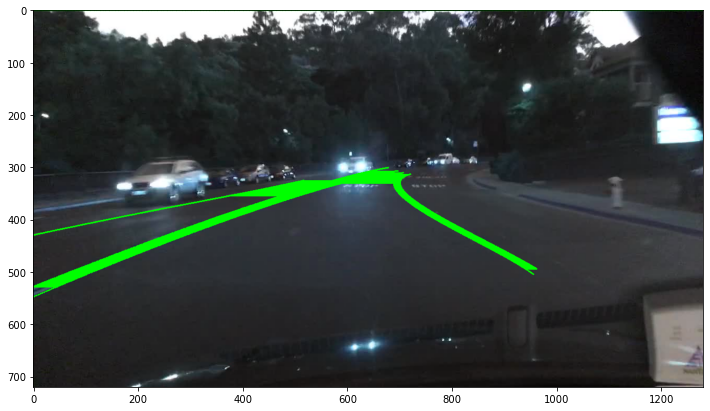

single white
double yellow
double yellow
single white
single white


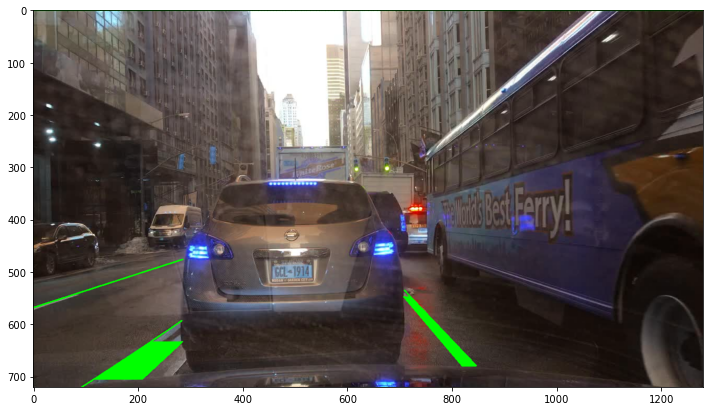

single white
single white
single white
single white


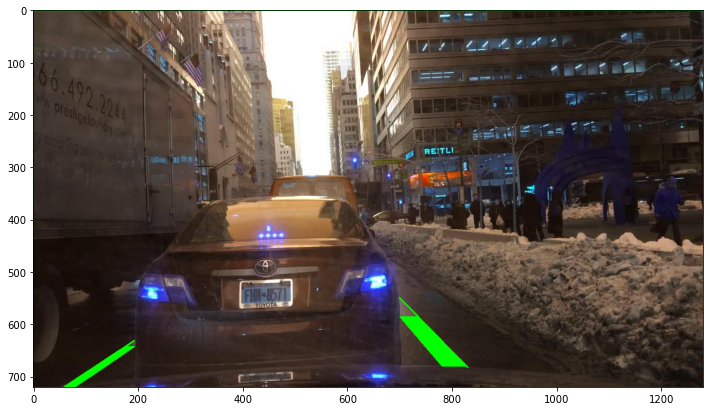

double yellow
single white


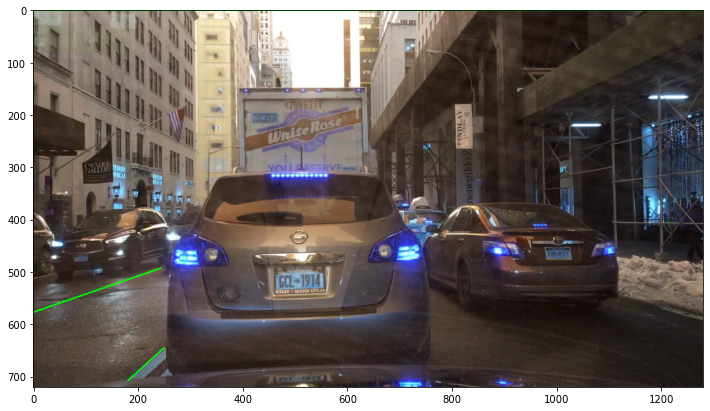

double yellow
double yellow
single white
single white
single white
single white


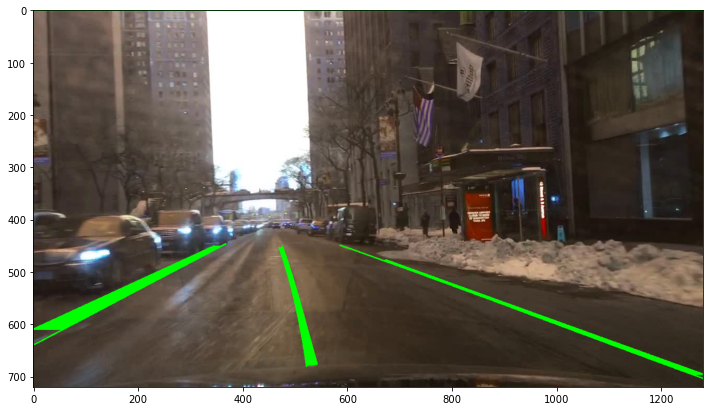

single white
single white


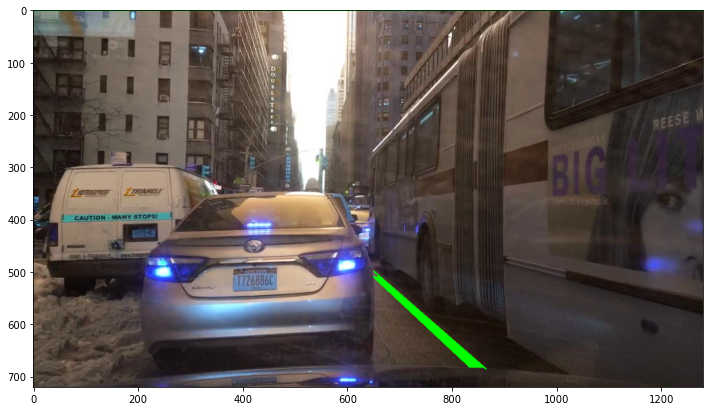

In [6]:
horizontal_curves = list()

for i in range(0, 800, 1):
    nodes = np.asarray([[0, 1280], [i, i]])

    horizontal_curve = bezier.Curve(
        nodes,
        degree=1,
    )
    horizontal_curves.append(horizontal_curve)

for frame_index in range(20):
    frame_info = frames_info[frame_index]
    if 'labels' not in frame_info.keys():
        continue

    img = cv2.imread(str(bdd100k_train_images_path / frame_info['name']))
    
    draw_curve(img, horizontal_curves[0], color_flag=(0, 255, 0))

    lane_curves = list()

    for i, lane in enumerate(frame_info['labels']):
        if lane['category'] in ['crosswalk', 'road curb']:
            continue
        else:
            print(lane['category'])

        lane_nodes = np.array(lane['poly2d'][0]['vertices'])
        lane_curve = bezier.Curve(
            lane_nodes.T,
            degree=lane_nodes.shape[0] - 1,
        )
        lane_curves.append(lane_curve)
        draw_curve(img, lane_curve, (0, 255, 0))
        
    for horizontal_curve in horizontal_curves:
        intersection_points = list()

        for lane_curve in lane_curves:
            intersection_point = lane_curve.intersect(horizontal_curve)
            intersection_point = lane_curve.evaluate_multi(intersection_point[0, :])

            if intersection_point.shape[1] != 0:
                x = int(intersection_point[0][0])
                y = int(intersection_point[1][0])
                '''
                for bias in range(-1, 2):
                    img = cv2.circle(
                        img,
                        (x, y),
                        radius=1,
                        color=(0, 255, 0),
                        thickness=-1,
                    )'''
                intersection_points.append((x, y))
                
        intersection_points.sort()

        for point_index in range(1, len(intersection_points)):
            x_start = int(intersection_points[point_index-1][0])
            x_end = int(intersection_points[point_index][0])
            delta_x = x_end - x_start
            if delta_x < 100: 
                y_start = int(intersection_points[point_index-1][1])
                y_end = int(intersection_points[point_index][1])
                for bias in range(-1, 2):
                    img = cv2.line(
                        img,
                        (x_start+1, y_start+bias),
                        (x_end-1, y_start+bias),
                        color=(0, 255, 0),
                        thickness=1,
                    )

    plt.figure(figsize=(12, 12))
    plt.imshow(img)
    plt.show()

In [7]:
### CULane

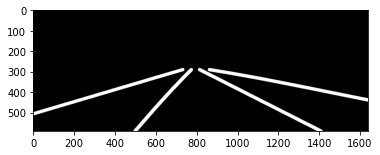

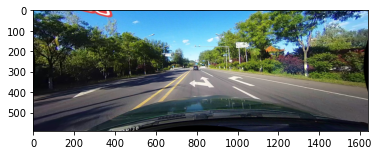

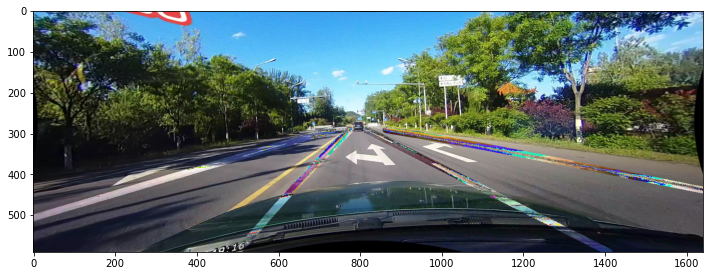

(590, 1640, 3)

In [58]:
culane_path = Path('/home/sergei/git/lanes/ultrafastlane/culane')

culane_info_path = culane_path / 'list/train_gt.txt'

with open(culane_info_path) as culane_info_file:
    lines = culane_info_file.readlines()
    
label_path = lines[0].split()[1]
image_path = lines[0].split()[0]

label_img = cv2.imread(str(culane_path) + label_path) * 255
raw_img = cv2.imread(str(culane_path) + image_path)
raw_img = cv2.cvtColor(raw_img, cv2.COLOR_BGR2RGB)

plt.imshow(label_img)
plt.show()
plt.imshow(raw_img)
plt.show()
plt.figure(figsize = (12, 12))
plt.imshow(raw_img * (1 - label_img))
plt.show()
img.shape

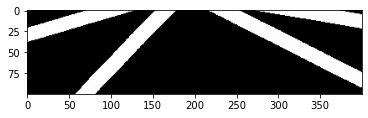

In [42]:
plt.imshow(img[300:400, 600:1000, :] * 255)